# K-Means Clustering of Stocks

Necessary library Imports

In [123]:
import numpy as np
import yfinance as yf
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from yahoo_fin import stock_info as si

from datetime import *
import sqlite3
import matplotlib.pyplot as plt

In [125]:
sp500url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
data_table = pd.read_html(sp500url)
data_table[0]

,Symbol,Security,GICS Sector,GICS Sub-Industry,Headquarters Location,Date added,CIK,Founded
0,MMM,3M,Industrials,Industrial Conglomerates,"Saint Paul, Minnesota",1957-03-04,66740,1902
1,AOS,A. O. Smith,Industrials,Building Products,"Milwaukee, Wisconsin",2017-07-26,91142,1916
2,ABT,Abbott,Health Care,Health Care Equipment,"North Chicago, Illinois",1957-03-04,1800,1888
3,ABBV,AbbVie,Health Care,Pharmaceuticals,"North Chicago, Illinois",2012-12-31,1551152,2013 (1888)
4,ACN,Accenture,Information Technology,IT Consulting & Other Services,"Dublin, Ireland",2011-07-06,1467373,1989
...,...,...,...,...,...,...,...,...
498,YUM,Yum! Brands,Consumer Discretionary,Restaurants,"Louisville, Kentucky",1997-10-06,1041061,1997
499,ZBRA,Zebra Technologies,Information Technology,Electronic Equipment & Instruments,"Lincolnshire, Illinois",2019-12-23,877212,1969
500,ZBH,Zimmer Biomet,Health Care,Health Care Equipment,"Warsaw, Indiana",2001-08-07,1136869,1927
501,ZION,Zions Bancorporation,Financials,Regional Banks,"Salt Lake City, Utah",2001-06-22,109380,1873


Set the start and end date

In [94]:
end_date = date.today()
start_date = end_date - pd.DateOffset(365*5) # 5 year data

Get Last 5 years data for all S&P500 stocks

In [95]:
stocks_list = si.tickers_sp500() # all s&p500 stocks
Five_yr_all_prices_df = yf.download(tickers=stocks_list, start=start_date, end=end_date)
Five_yr_all_prices_df

[*********************100%***********************]  503 of 503 completed


Adj Close                                     \
                                    A        AAL         AAP        AAPL   
Date                                                                       
2018-04-09 00:00:00-04:00   62.812225  48.651241  103.793205   40.528065   
2018-04-10 00:00:00-04:00   64.209343  46.346615  105.476837   41.290726   
2018-04-11 00:00:00-04:00   63.669754  44.334938  104.338730   41.097672   
2018-04-12 00:00:00-04:00   64.748909  45.477497  104.000122   41.502827   
2018-04-13 00:00:00-04:00   64.758560  44.793919  100.275414   41.643459   
...                               ...        ...         ...         ...   
2023-03-30 00:00:00-04:00  134.271271  14.470000  118.610001  162.360001   
2023-03-31 00:00:00-04:00  138.114990  14.750000  121.610001  164.899994   
2023-04-03 00:00:00-04:00  137.860001  14.420000  122.690002  166.169998   
2023-04-04 00:00:00-04:00  138.210007  14.160000  121.339996  165.630005   
2023-04-05 00:00:00-04:00  138.089996  13.890000  120.209999  163.759995   

                                                                          \
                                 ABBV         ABC         ABT       ACGL   
Date                                                                       
2018-04-09 00:00:00-04:00   71.567154   80.055740   53.637543  26.790001   
2018-04-10 00:00:00-04:00   74.050812   82.011253   54.485126  26.256666   
2018-04-11 00:00:00-04:00   74.066628   82.177292   53.849438  26.596666   
2018-04-12 00:00:00-04:00   73.619080   81.347130   54.460415  26.983334   
2018-04-13 00:00:00-04:00   73.387344   80.083412   54.145676  26.973333   
...                               ...         ...         ...        ...   
2023-03-30 00:00:00-04:00  157.919998  159.339996   99.080002  67.860001   
2023-03-31 00:00:00-04:00  159.369995  160.110001  101.260002  67.870003   
2023-04-03 00:00:00-04:00  160.419998  162.279999  101.589996  68.610001   
2023-04-04 00:00:00-04:00  159.779999  162.970001  102.800003  67.889999   
2023-04-05 00:00:00-04:00  160.800003  167.360001  104.209999  68.589996   

                                                   ...   Volume           \
                                  ACN        ADBE  ...     WYNN      XEL   
Date                                               ...                     
2018-04-09 00:00:00-04:00  137.364471  219.169998  ...  1896900  2672900   
2018-04-10 00:00:00-04:00  140.885391  224.529999  ...  1978600  3700300   
2018-04-11 00:00:00-04:00  138.716782  223.630005  ...  1180900  2973600   
2018-04-12 00:00:00-04:00  140.296509  226.960007  ...  3135900  3252600   
2018-04-13 00:00:00-04:00  140.333923  224.059998  ...  1477500  3381100   
...                               ...         ...  ...      ...      ...   
2023-03-30 00:00:00-04:00  282.660004  381.899994  ...  1915800  1993900   
2023-03-31 00:00:00-04:00  285.809998  385.369995  ...  3731400  5987400   
2023-04-03 00:00:00-04:00  285.839996  380.079987  ...  3743600  3890600   
2023-04-04 00:00:00-04:00  285.839996  385.149994  ...  2255700  3180400   
2023-04-05 00:00:00-04:00  281.329987  382.019989  ...  2356000  4231500   

                                                                         \
                                XOM     XRAY      XYL      YUM      ZBH   
Date                                                                      
2018-04-09 00:00:00-04:00  11103100  1975400   567200  1490100  1241768   
2018-04-10 00:00:00-04:00  19006100  2103200   832100  2342900  1222198   
2018-04-11 00:00:00-04:00  13734000  1632200   982700  1586500   656522   
2018-04-12 00:00:00-04:00  13270400  1152000   747100  1679000   759728   
2018-04-13 00:00:00-04:00  10925000  1508200   625000  1634000   821837   
...                             ...      ...      ...      ...      ...   
2023-03-30 00:00:00-04:00  11578200  1982600   949300  1183100   791500   
2023-03-31 00:00:00-04:00  14416800  1787100  2059400  1705800  1212600   
2023-04-

For each date, we have 503 stacks and column wise info about adj close, close, high, low, open, volume

In [96]:
prices_df = Five_yr_all_prices_df.stack()
prices_df

Adj Close       Close        High  \
Date                                                                 
2018-04-09 00:00:00-04:00 A      62.812225   65.190002   66.250000   
                          AAL    48.651241   49.820000   50.860001   
                          AAP   103.793205  110.349998  114.889999   
                          AAPL   40.528065   42.512501   43.272499   
                          ABBV   71.567154   90.480003   93.379997   
...                                    ...         ...         ...   
2023-04-05 00:00:00-04:00 YUM   131.940002  131.940002  133.009995   
                          ZBH   128.589996  128.589996  129.179993   
                          ZBRA  300.149994  300.149994  308.480011   
                          ZION   28.629999   28.629999   28.830000   
                          ZTS   167.649994  167.649994  168.610001   

                                       Low        Open       Volume  
Date                                                                 
2018-04-09 00:00:00-04:00 A      64.080002   64.919998    2639800.0  
                          AAL    49.740002   50.500000    4330100.0  
                          AAP   110.190002  112.940002     829500.0  
                          AAPL   42.462502   42.470001  116070800.0  
                          ABBV   90.419998   91.389999    8302100.0  
...                                    ...         ...          ...  
2023-04-05 00:00:00-04:00 YUM   131.919998  132.009995    1212400.0  
                          ZBH   127.849998  128.369995    1064800.0  
                          ZBRA  299.059998  308.480011     185400.0  
                          ZION   26.930000   27.730000    9830300.0  
                          ZTS   166.300003  167.000000    1216200.0  

[627709 rows x 6 columns]

Save the Data to CSV and use CSV henceforth

In [97]:
prices_df.to_csv('prices_df.csv')

Read data from CSV

In [98]:
df = pd.read_csv('prices_df.csv', parse_dates=['Date'])
df

,Date,Unnamed: 1,Adj Close,Close,High,Low,Open,Volume
0,2018-04-09 00:00:00-04:00,A,62.812225,65.190002,66.250000,64.080002,64.919998,2639800.0
1,2018-04-09 00:00:00-04:00,AAL,48.651241,49.820000,50.860001,49.740002,50.500000,4330100.0
2,2018-04-09 00:00:00-04:00,AAP,103.793205,110.349998,114.889999,110.190002,112.940002,829500.0
3,2018-04-09 00:00:00-04:00,AAPL,40.528065,42.512501,43.272499,42.462502,42.470001,116070800.0
4,2018-04-09 00:00:00-04:00,ABBV,71.567154,90.480003,93.379997,90.419998,91.389999,8302100.0
...,...,...,...,...,...,...,...,...
627704,2023-04-05 00:00:00-04:00,YUM,131.940002,131.940002,133.009995,131.919998,132.009995,1212400.0
627705,2023-04-05 00:00:00-04:00,ZBH,128.589996,128.589996,129.179993,127.849998,128.369995,1064800.0
627706,2023-04-05 00:00:00-04:00,ZBRA,300.149994,300.149994,308.480011,299.059998,308.480011,185400.0
627707,2023-04-05 00:00:00-04:00,ZION,28.629999,28.629999,28.830000,26.930000,27.730000,9830300.0


In [99]:
df.columns = ['Date','Symbol','Adj Close','Close','High','Low','Open','Volume']
df

,Date,Symbol,Adj Close,Close,High,Low,Open,Volume
0,2018-04-09 00:00:00-04:00,A,62.812225,65.190002,66.250000,64.080002,64.919998,2639800.0
1,2018-04-09 00:00:00-04:00,AAL,48.651241,49.820000,50.860001,49.740002,50.500000,4330100.0
2,2018-04-09 00:00:00-04:00,AAP,103.793205,110.349998,114.889999,110.190002,112.940002,829500.0
3,2018-04-09 00:00:00-04:00,AAPL,40.528065,42.512501,43.272499,42.462502,42.470001,116070800.0
4,2018-04-09 00:00:00-04:00,ABBV,71.567154,90.480003,93.379997,90.419998,91.389999,8302100.0
...,...,...,...,...,...,...,...,...
627704,2023-04-05 00:00:00-04:00,YUM,131.940002,131.940002,133.009995,131.919998,132.009995,1212400.0
627705,2023-04-05 00:00:00-04:00,ZBH,128.589996,128.589996,129.179993,127.849998,128.369995,1064800.0
627706,2023-04-05 00:00:00-04:00,ZBRA,300.149994,300.149994,308.480011,299.059998,308.480011,185400.0
627707,2023-04-05 00:00:00-04:00,ZION,28.629999,28.629999,28.830000,26.930000,27.730000,9830300.0


In [100]:
df = df[['Date','Close','Symbol']]
df.head()

,Date,Close,Symbol
0,2018-04-09 00:00:00-04:00,65.190002,A
1,2018-04-09 00:00:00-04:00,49.820000,AAL
2,2018-04-09 00:00:00-04:00,110.349998,AAP
3,2018-04-09 00:00:00-04:00,42.512501,AAPL
4,2018-04-09 00:00:00-04:00,90.480003,ABBV


Use pivot

In [101]:
stocks = df.pivot_table(index='Date', columns='Symbol', values='Close')
stocks = stocks.dropna(axis=1)
stocks.head()

Symbol,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACGL,ACN,ADBE,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2018-04-09 00:00:00-04:00,65.190002,49.820000,110.349998,42.512501,90.480003,86.790001,58.220001,26.790001,148.250000,219.169998,...,180.380005,45.509998,74.870003,49.250000,75.709999,84.449997,103.106796,136.149994,51.630001,81.870003
2018-04-10 00:00:00-04:00,66.639999,47.459999,112.139999,43.312500,93.620003,88.910004,59.139999,26.256666,152.050003,224.529999,...,183.279999,45.029999,77.070000,49.750000,76.779999,85.580002,104.165047,141.589996,52.400002,83.089996
2018-04-11 00:00:00-04:00,66.080002,45.400002,110.930000,43.110001,93.639999,89.089996,58.450001,26.596666,148.399994,223.630005,...,179.830002,44.840000,77.430000,49.290001,76.190002,85.440002,102.941750,141.250000,52.139999,83.070000
2018-04-12 00:00:00-04:00,67.199997,46.570000,110.570000,43.535000,92.120003,88.190002,58.830002,26.983334,150.089996,226.960007,...,186.639999,44.020000,77.220001,49.189999,77.120003,85.750000,103.320389,141.300003,54.130001,83.959999
2018-04-13 00:00:00-04:00,67.209999,45.869999,106.610001,43.682499,91.830002,86.820000,58.490002,26.973333,150.130005,224.059998,...,183.809998,44.480000,77.839996,49.000000,76.830002,85.419998,102.495148,141.240005,52.849998,83.570000


In [102]:
stocks.index = pd.to_datetime(stocks.index, utc=True)
stocks

Symbol,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACGL,ACN,ADBE,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2018-04-09 04:00:00+00:00,65.190002,49.820000,110.349998,42.512501,90.480003,86.790001,58.220001,26.790001,148.250000,219.169998,...,180.380005,45.509998,74.870003,49.250000,75.709999,84.449997,103.106796,136.149994,51.630001,81.870003
2018-04-10 04:00:00+00:00,66.639999,47.459999,112.139999,43.312500,93.620003,88.910004,59.139999,26.256666,152.050003,224.529999,...,183.279999,45.029999,77.070000,49.750000,76.779999,85.580002,104.165047,141.589996,52.400002,83.089996
2018-04-11 04:00:00+00:00,66.080002,45.400002,110.930000,43.110001,93.639999,89.089996,58.450001,26.596666,148.399994,223.630005,...,179.830002,44.840000,77.430000,49.290001,76.190002,85.440002,102.941750,141.250000,52.139999,83.070000
2018-04-12 04:00:00+00:00,67.199997,46.570000,110.570000,43.535000,92.120003,88.190002,58.830002,26.983334,150.089996,226.960007,...,186.639999,44.020000,77.220001,49.189999,77.120003,85.750000,103.320389,141.300003,54.130001,83.959999
2018-04-13 04:00:00+00:00,67.209999,45.869999,106.610001,43.682499,91.830002,86.820000,58.490002,26.973333,150.130005,224.059998,...,183.809998,44.480000,77.839996,49.000000,76.830002,85.419998,102.495148,141.240005,52.849998,83.570000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-30 04:00:00+00:00,134.490005,14.470000,118.610001,162.360001,157.919998,159.339996,99.080002,67.860001,282.660004,381.899994,...,109.000000,66.910004,109.489998,38.560001,102.400002,129.330002,126.760002,309.109985,30.299999,164.149994
2023-03-31 04:00:00+00:00,138.339996,14.750000,121.610001,164.899994,159.369995,160.110001,101.260002,67.870003,285.809998,385.369995,...,111.910004,67.440002,109.660004,39.279999,104.699997,132.080002,129.199997,318.000000,29.930000,166.440002
2023-04-03 04:00:00+00:00,137.860001,14.420000,122.690002,166.169998,160.419998,162.279999,101.589996,68.610001,285.839996,380.079987,...,113.330002,67.519997,116.129997,39.110001,104.459999,133.210007,128.039993,311.649994,29.120001,167.660004


Resample Data - <br>
- W for weekly Data <br>
- M for monthly Data <br>
- Q for Quarter <br>
- A for Year/annual <br>

Resampling by Week

In [103]:
stocks = stocks.resample('W').last()
stocks.head()

Symbol,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACGL,ACN,ADBE,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2018-04-15 00:00:00+00:00,67.209999,45.869999,106.610001,43.682499,91.830002,86.820000,58.490002,26.973333,150.130005,224.059998,...,183.809998,44.480000,77.839996,49.000000,76.830002,85.419998,102.495148,141.240005,52.849998,83.570000
2018-04-22 00:00:00+00:00,67.550003,46.779999,103.760002,41.430000,92.599998,89.870003,59.189999,27.016666,152.410004,225.240005,...,192.509995,45.099998,79.000000,49.340000,79.269997,86.290001,107.106796,142.149994,53.799999,85.449997
2018-04-29 00:00:00+00:00,66.279999,43.400002,116.339996,40.580002,98.730003,93.070000,59.560001,27.226667,152.389999,221.899994,...,185.110001,47.099998,77.790001,50.340000,73.709999,87.050003,113.514565,135.130005,55.599998,84.839996
2018-05-06 00:00:00+00:00,67.000000,42.860001,116.669998,45.957500,100.169998,86.370003,58.740002,26.276667,153.440002,228.509995,...,192.410004,46.389999,76.900002,49.990002,70.080002,82.430000,112.834953,134.669998,55.459999,81.559998
2018-05-13 00:00:00+00:00,69.449997,42.599998,119.940002,47.147499,104.180000,86.879997,61.259998,26.549999,157.080002,241.880005,...,195.649994,45.259998,81.279999,46.930000,73.529999,84.620003,113.048546,155.570007,57.810001,84.449997


## Exploratory Data Analysis

In [115]:
# Print the column names as a list
print(stocks.columns)

Index(['A', 'AAL', 'AAP', 'AAPL', 'ABBV', 'ABC', 'ABT', 'ACGL', 'ACN', 'ADBE',
       ...
       'WYNN', 'XEL', 'XOM', 'XRAY', 'XYL', 'YUM', 'ZBH', 'ZBRA', 'ZION',
       'ZTS'],
      dtype='object', name='Symbol', length=492)


In [161]:
def get_name(symbol):
    name = symbol
    try:
        # Convert the DataFrame to a dictionary
        symbol_to_name = dict(zip(data_table[0]['Symbol'], data_table[0]['Security']))
        # Look up the name based on the symbol
        name = symbol_to_name[symbol]
    except KeyError:
        pass
    return name

def plot_stock(symbol, stocks=stocks):
    name = get_name(symbol)
    # name = symbol
    stocks[symbol].plot(title=name, label=name, alpha=0.9)

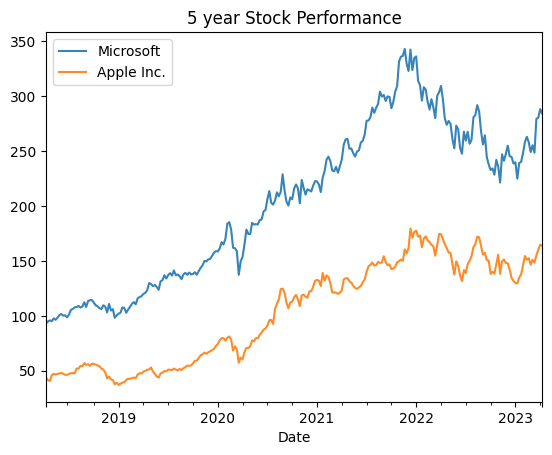

In [162]:
plot_stock('MSFT')
plot_stock('AAPL')
plt.title("5 year Stock Performance")
plt.legend()

Computing the returns from first day of purchase. So, the return of any given day is how much it would be earned/lost in percentage, if the stock would be sold at this day. (Transaction costs not considered)

In [163]:
start = stocks.iloc[0]
returns = (stocks - start) / start

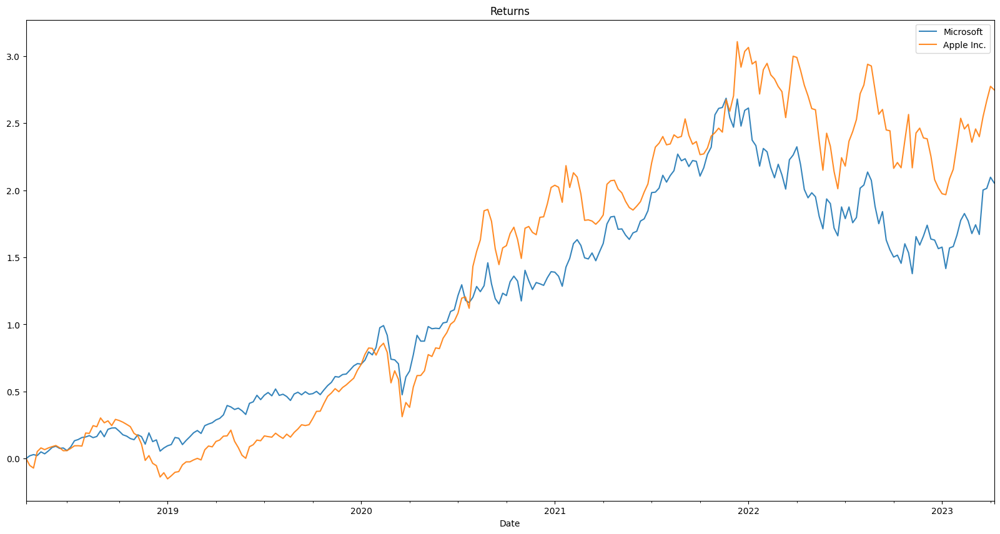

In [164]:
plt.figure(figsize= (20,10))
plot_stock('MSFT', stocks=returns)
plot_stock('AAPL',stocks=returns)
plt.title('Returns')
plt.legend()

# Determining the best & worst performing stocks in the last 5 years

In [168]:
best = returns.iloc[-1].sort_values(ascending=False).head()
worst = returns.iloc[-1].sort_values().head()

In [169]:
print('Best Performing Stocks')
names = pd.DataFrame({'name':[get_name(symbol) for symbol in best.index.to_list()]}, index = best.index)
best = pd.concat((best, names), axis=1)
best

Best Performing Stocks


,2023-04-09 00:00:00+00:00,name
Symbol,,
ENPH,48.154821,Enphase
AMD,8.321248,AMD
TSLA,8.265499,"Tesla, Inc."
DXCM,5.234872,Dexcom
FTNT,4.833632,Fortinet


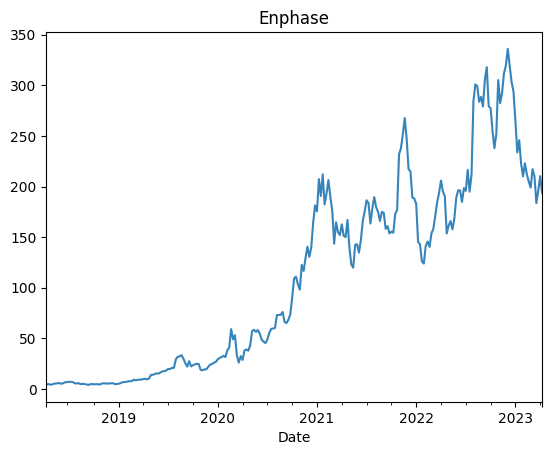

In [170]:
plot_stock('ENPH')

Text(0.5, 1.0, 'Enphase Returns')

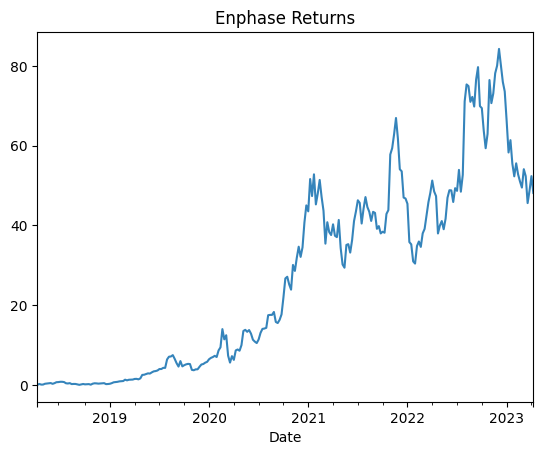

In [171]:
plot_stock('ENPH', stocks=returns)
plt.title('Enphase Returns')

Worst Performing Stocks

In [173]:
print("Worst performing stocks")
names = pd.DataFrame({'name':[get_name(symbol) for symbol in worst.index.to_list()]}, index = worst.index)
worst = pd.concat((worst, names), axis=1)
worst

Worst performing stocks


,2023-04-09 00:00:00+00:00,name
Symbol,,
FRC,-0.852954,First Republic Bank
CCL,-0.846520,Carnival
DISH,-0.778614,Dish Network
VTRS,-0.758740,Viatris
NCLH,-0.753529,Norwegian Cruise Line Holdings


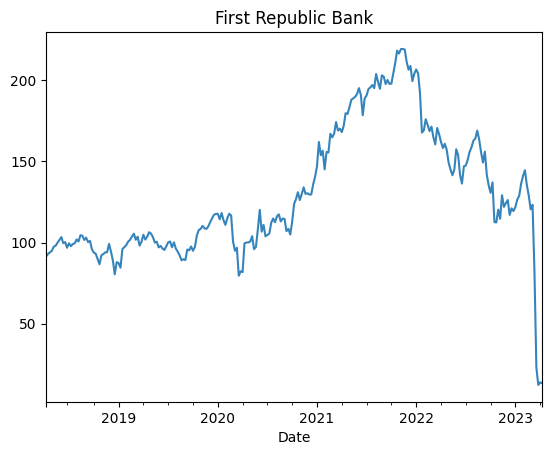

In [174]:
plot_stock('FRC')

Text(0.5, 1.0, 'First Republic Bank Returns')

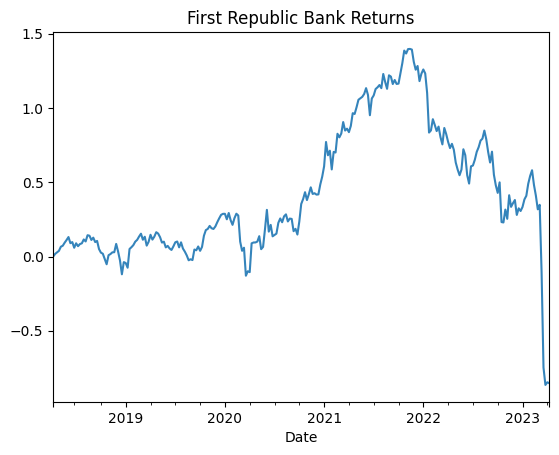

In [175]:
plot_stock('FRC', stocks=returns)
plt.title('First Republic Bank Returns')

# Clustering

In [176]:
print("Number of Dimensions: ", len(returns))

Number of Dimensions:  261


This means we have 261 weeks in the past 5 years

In [178]:
kmeans = KMeans(n_clusters=8, random_state=42)
kmeans.fit(returns.T)

clusters = {}
for l in np.unique(kmeans.labels_):
    clusters[l] = []

for i,l in enumerate(kmeans.predict(returns.T)):
    clusters[l].append(returns.columns[i])

for c in sorted(clusters):
    print('Cluster '+str(c) + ': ', end='')
    for symbol in clusters[c]:
        print(get_name(symbol)+' ('+symbol+')',end=' ### ')
    print()
    print()

Cluster 0: AbbVie (ABBV) ### American Electric Power (AEP) ### Aflac (AFL) ### Akamai (AKAM) ### Allstate (ALL) ### Allegion (ALLE) ### Amcor (AMCR) ### Amgen (AMGN) ### Aptiv (APTV) ### Alexandria Real Estate Equities (ARE) ### Atmos Energy (ATO) ### Activision Blizzard (ATVI) ### AvalonBay Communities (AVB) ### Bank of America (BAC) ### Baxter International (BAX) ### Best Buy (BBY) ### Becton Dickinson (BDX) ### BF-B (BF-B) ### Bunge Limited (BG) ### Biogen (BIIB) ### Booking Holdings (BKNG) ### BlackRock (BLK) ### Bristol Myers Squibb (BMY) ### Broadridge Financial Solutions (BR) ### BRK-B (BRK-B) ### Caterpillar Inc. (CAT) ### Chubb Limited (CB) ### Cboe Global Markets (CBOE) ### Celanese (CE) ### C.H. Robinson (CHRW) ### Cigna (CI) ### Colgate-Palmolive (CL) ### Clorox (CLX) ### Comcast (CMCSA) ### CME Group (CME) ### Cummins (CMI) ### Centene Corporation (CNC) ### Capital One (COF) ### ConocoPhillips (COP) ### Campbell Soup Company (CPB) ### Cisco (CSCO) ### CVS Health (CVS) ### 

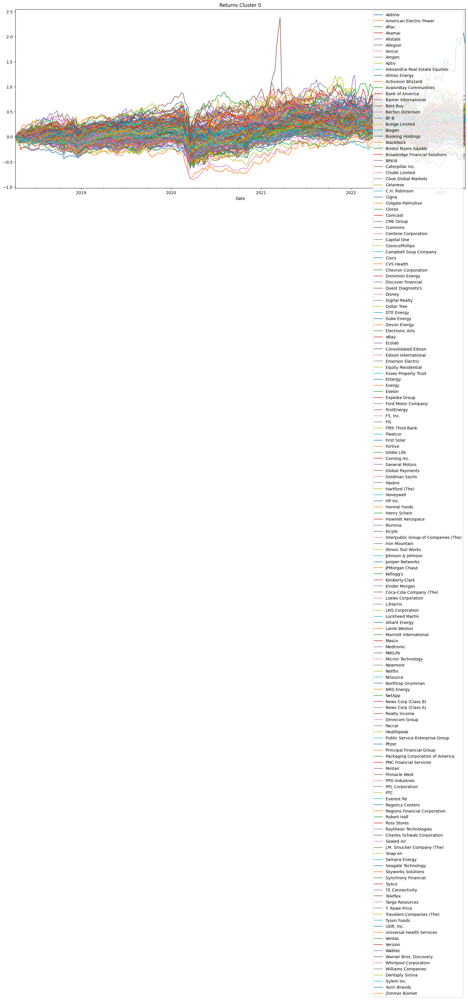

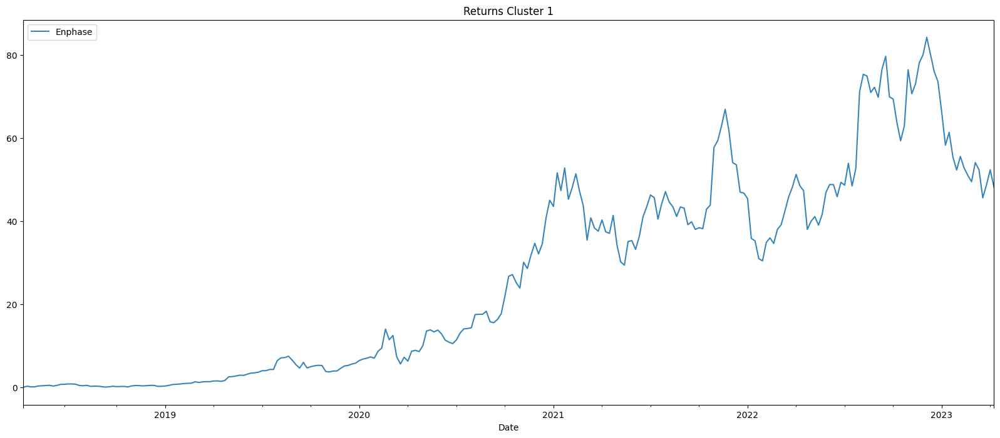

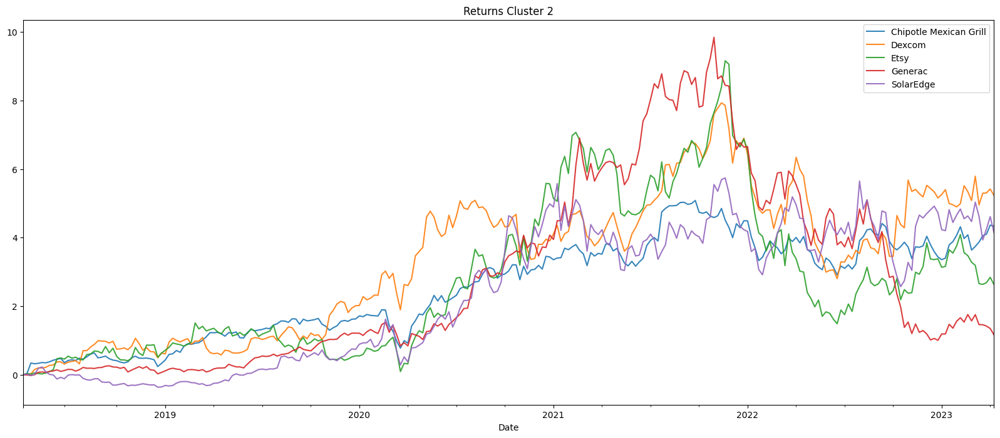

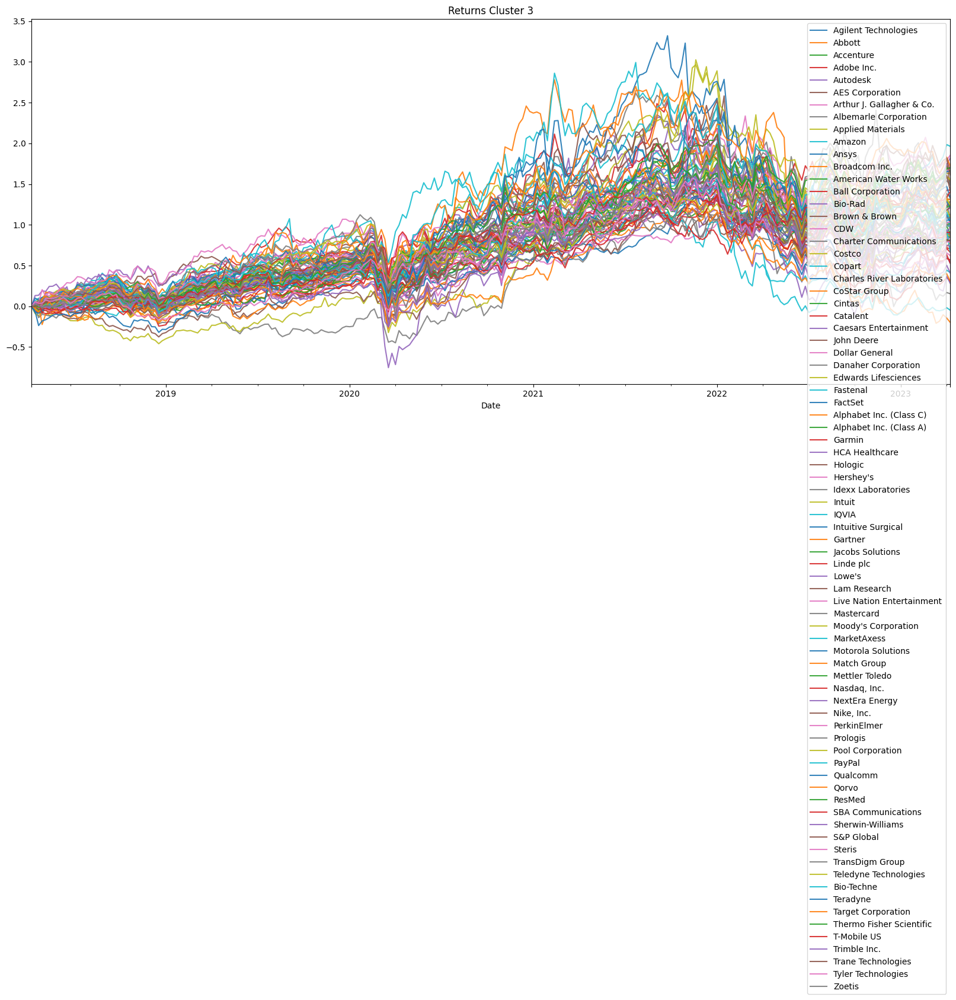

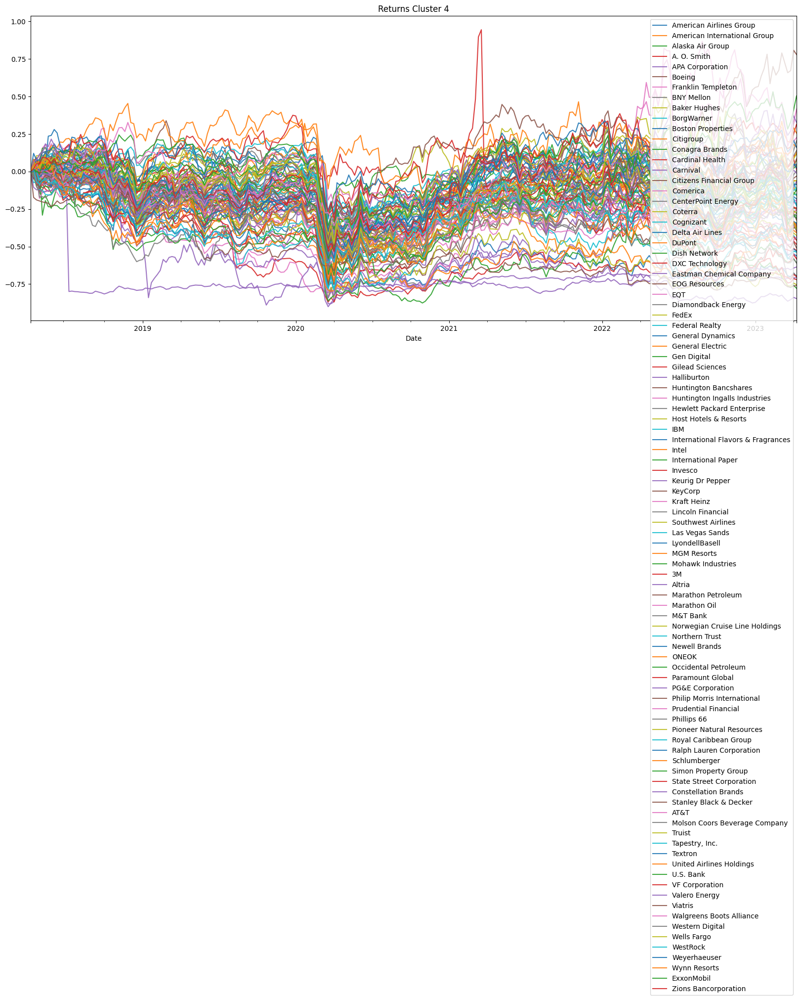

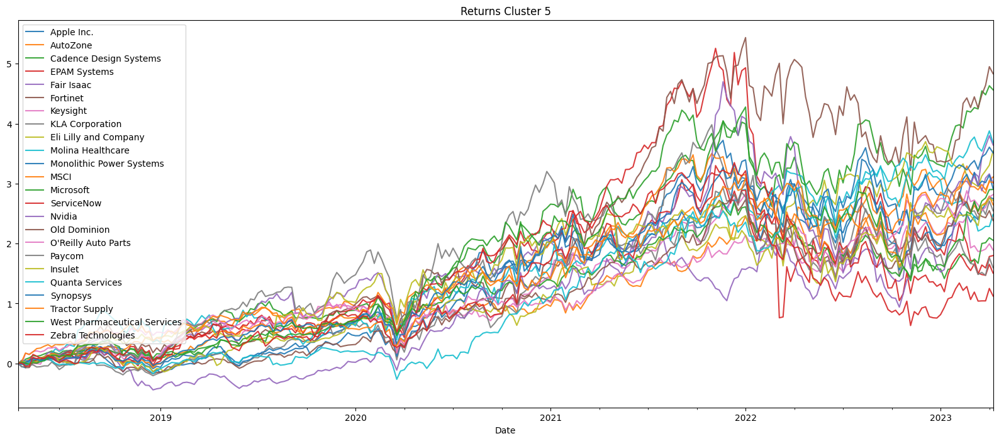

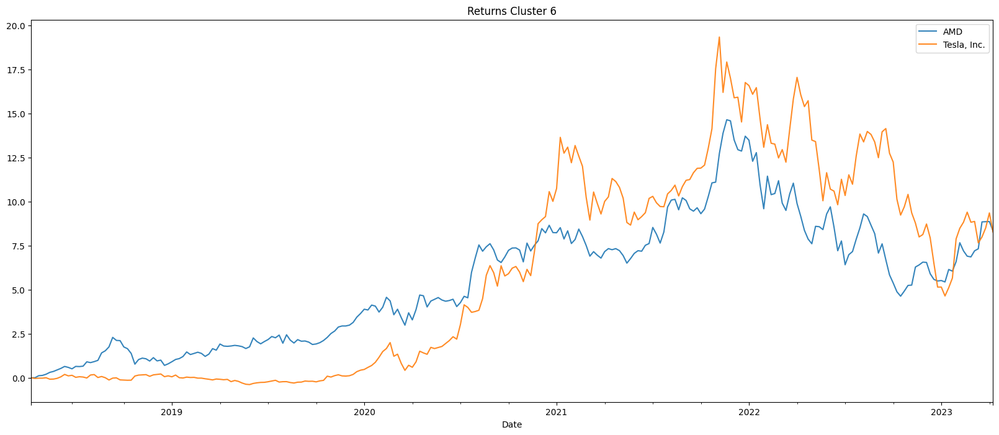

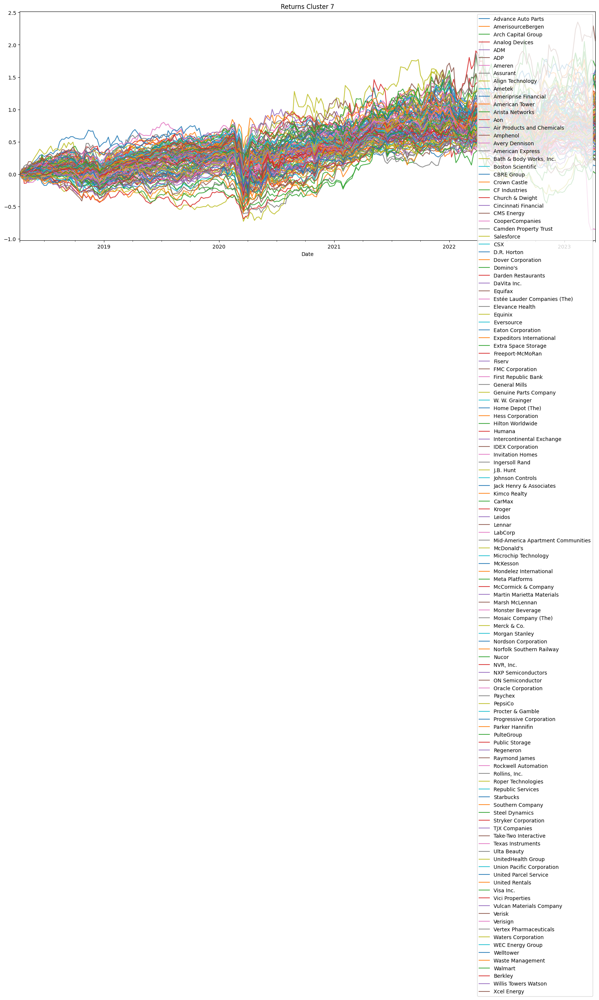

In [179]:
for c in sorted(clusters):
    plt.figure(figsize = (20,8))
    for symbol in clusters[c]:
        plot_stock(symbol, stocks=returns)
    plt.title("Returns Cluster " + str(c))
    plt.legend()
    plt.show()

## Principal Component Analysis

We are taking 261 weeks of data. Let's just keep 95% of the variance.

In [230]:
pca = PCA(n_components=2, random_state=1)
components = pca.fit_transform(returns.T)
print("Number of PCA components: ", components.shape[1])
print("PCA Explained Variance Ratio: ", pca.explained_variance_ratio_)
print("PCA Total Explained Variance: ", np.sum(pca.explained_variance_ratio_))

Number of PCA components:  2
PCA Explained Variance Ratio:  [0.96189683 0.02181262]
PCA Total Explained Variance:  0.9837094519130831


We can now see how well can this represent the signal by using the PCA_inverse_transform to go from the PCA components to the returns. Then we are going to plot the original returns from the PCA components to get a visual intuition.

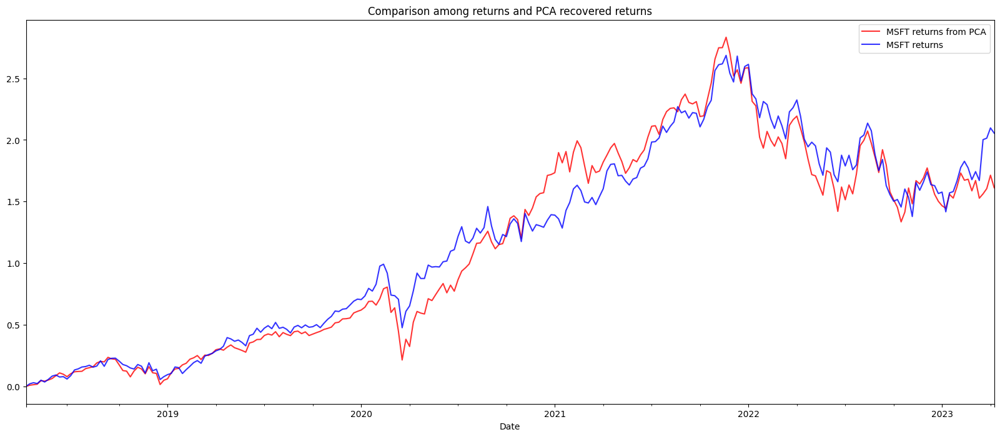

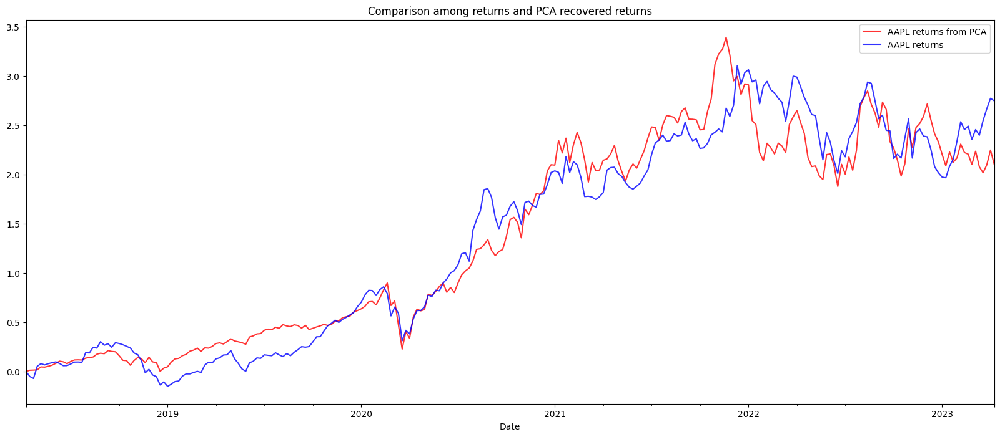

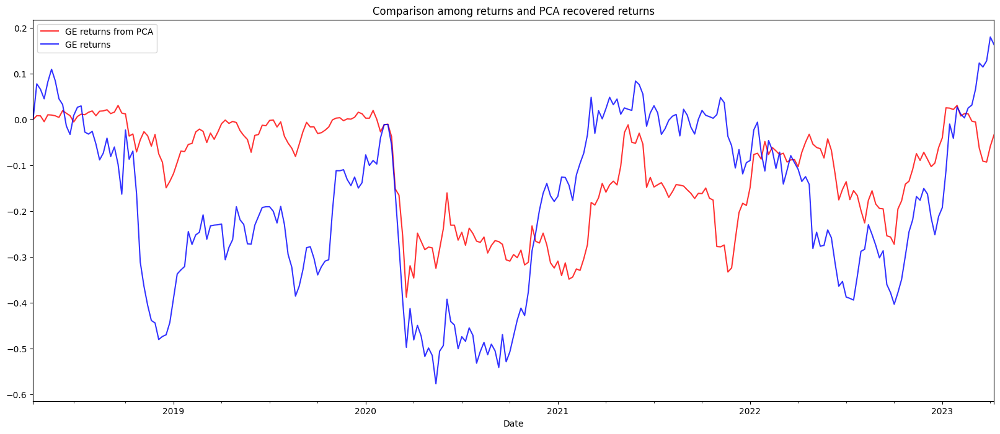

In [231]:
for stock in ['MSFT', 'AAPL', 'GE']:
    pos_stock = returns.columns.to_list().index(stock)
    stock_from_pca = pca.inverse_transform(components[pos_stock,:])
    stock_from_pca = pd.Series(stock_from_pca, name=stock, index=returns.index)
    plt.figure(figsize=(20,8))

    stock_from_pca.plot(label=stock + ' returns from PCA', color='red', alpha=0.8)
    returns[stock].plot(label=stock + ' returns', color='blue', alpha=0.8)
    plt.title('Comparison among returns and PCA recovered returns')
    plt.legend()
    plt.show()

Now we visualize the first 2 components

In [232]:
plt.figure(figsize=(20,10))
plt.scatter(components[:, 0], components[:, 20])
# for i in range(components.shape[0]):
#     plt.text(x=components[i, 0]+0.05, y=components[i, 1]-0.025, s=returns.columns[i])
plt.title('PCA Components')

IndexError: index 20 is out of bounds for axis 1 with size 2

<Figure size 2000x1000 with 0 Axes>

Text(0.5, 1.0, 'PCA components - color: log return after 5 years')

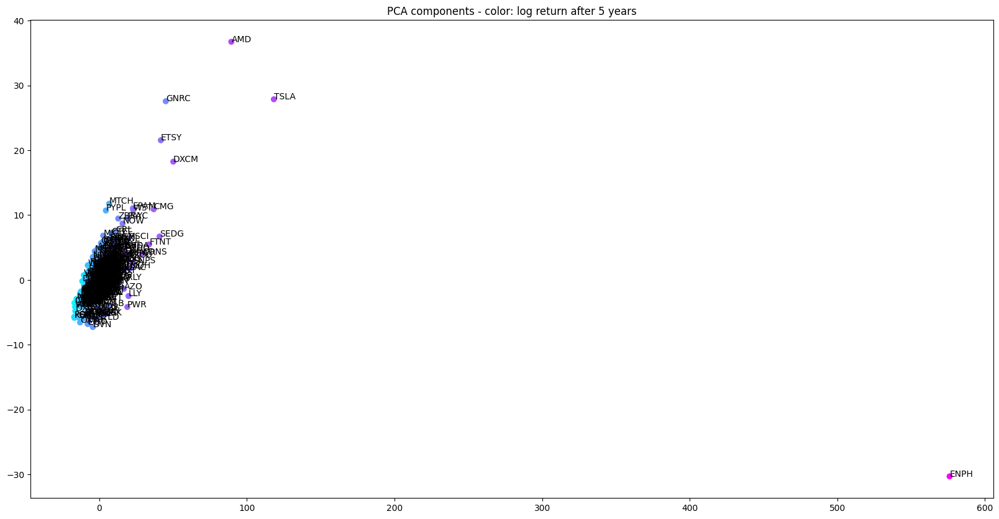

In [233]:
plt.figure(figsize=(20,10))
plt.scatter(components[:,0], components[:,1], c=returns.iloc[-1].T.apply(np.log1p),cmap='cool')
for i in range(components.shape[0]):
    symbol = returns.columns[i]
    plt.text(x=components[i,0]+0.05, y=components[i,1]-0.025, s=symbol)
plt.title('PCA components - color: log return after 5 years')

Pink - performed better

Clustering with PCA components

In [234]:
print("Number of dimensions for clustering with PCA: ", len(components.T))

Number of dimensions for clustering with PCA:  2


In [235]:
kmeans = KMeans(n_clusters=8, random_state=42)
kmeans.fit(components)

clusters = {}
for l in np.unique(kmeans.labels_):
    clusters[l] = []

for i,l in enumerate(kmeans.predict(components)):
    clusters[l].append(returns.columns[i])

for c in sorted(clusters):
    print('Cluster '+str(c) + ': ', end='')
    for symbol in clusters[c]:
        print(get_name(symbol)+' ('+symbol+')',end=' ### ')
    print()
    print()

Cluster 0: AbbVie (ABBV) ### American Electric Power (AEP) ### Aflac (AFL) ### Akamai (AKAM) ### Allstate (ALL) ### Allegion (ALLE) ### Amcor (AMCR) ### Amgen (AMGN) ### Aptiv (APTV) ### Alexandria Real Estate Equities (ARE) ### Atmos Energy (ATO) ### Activision Blizzard (ATVI) ### AvalonBay Communities (AVB) ### Bank of America (BAC) ### Baxter International (BAX) ### Best Buy (BBY) ### Becton Dickinson (BDX) ### BF-B (BF-B) ### Bunge Limited (BG) ### Booking Holdings (BKNG) ### BlackRock (BLK) ### Bristol Myers Squibb (BMY) ### Broadridge Financial Solutions (BR) ### BRK-B (BRK-B) ### Caterpillar Inc. (CAT) ### Chubb Limited (CB) ### Cboe Global Markets (CBOE) ### Celanese (CE) ### C.H. Robinson (CHRW) ### Cigna (CI) ### Colgate-Palmolive (CL) ### Clorox (CLX) ### Comcast (CMCSA) ### CME Group (CME) ### Cummins (CMI) ### CMS Energy (CMS) ### Centene Corporation (CNC) ### Capital One (COF) ### ConocoPhillips (COP) ### Campbell Soup Company (CPB) ### Cisco (CSCO) ### CVS Health (CVS) #

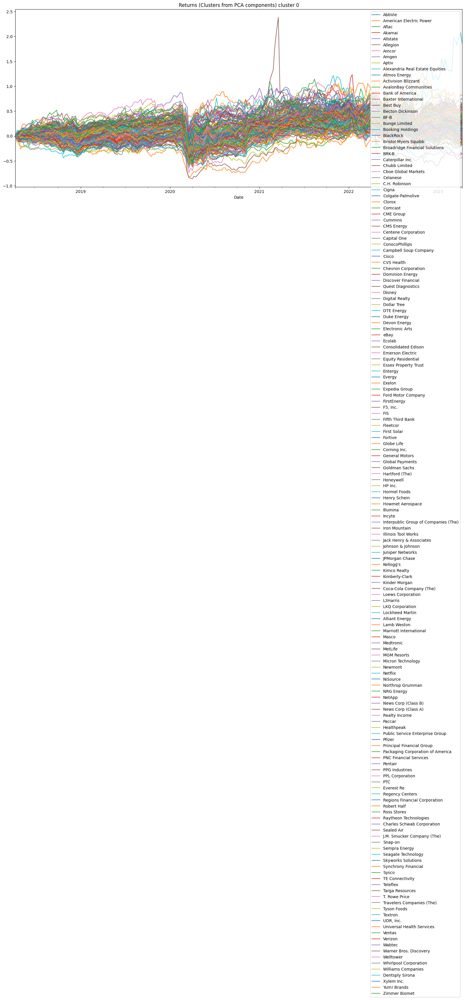

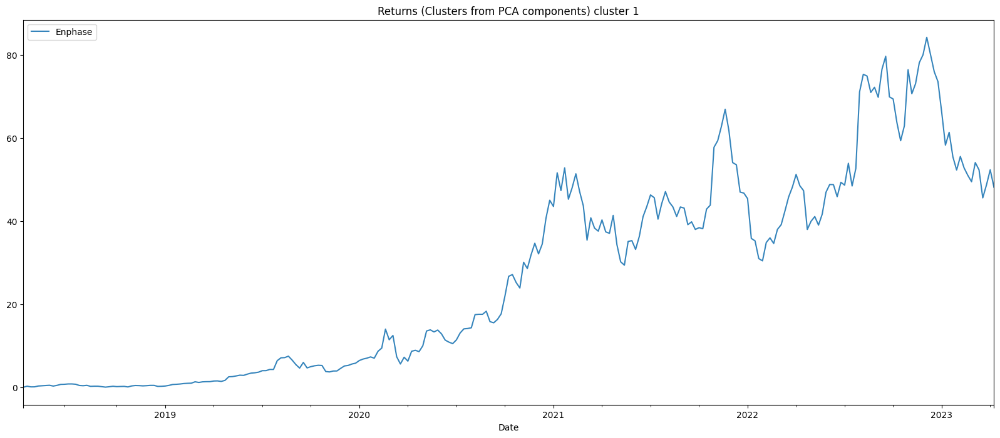

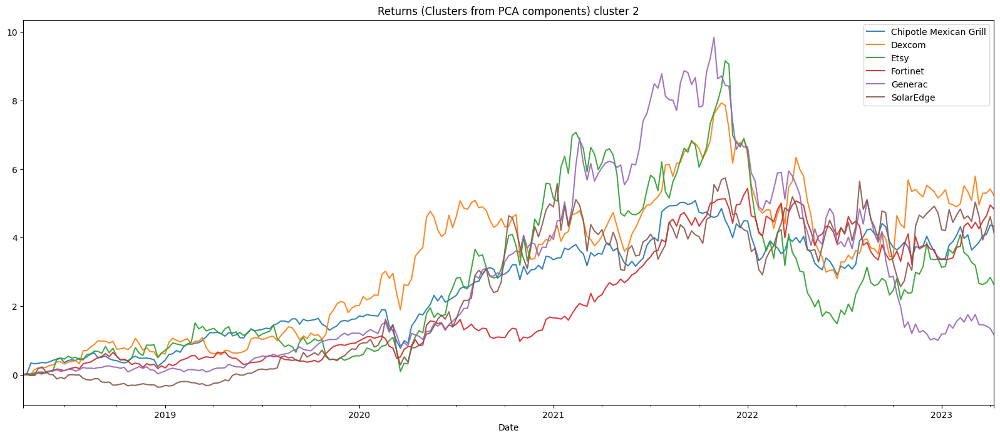

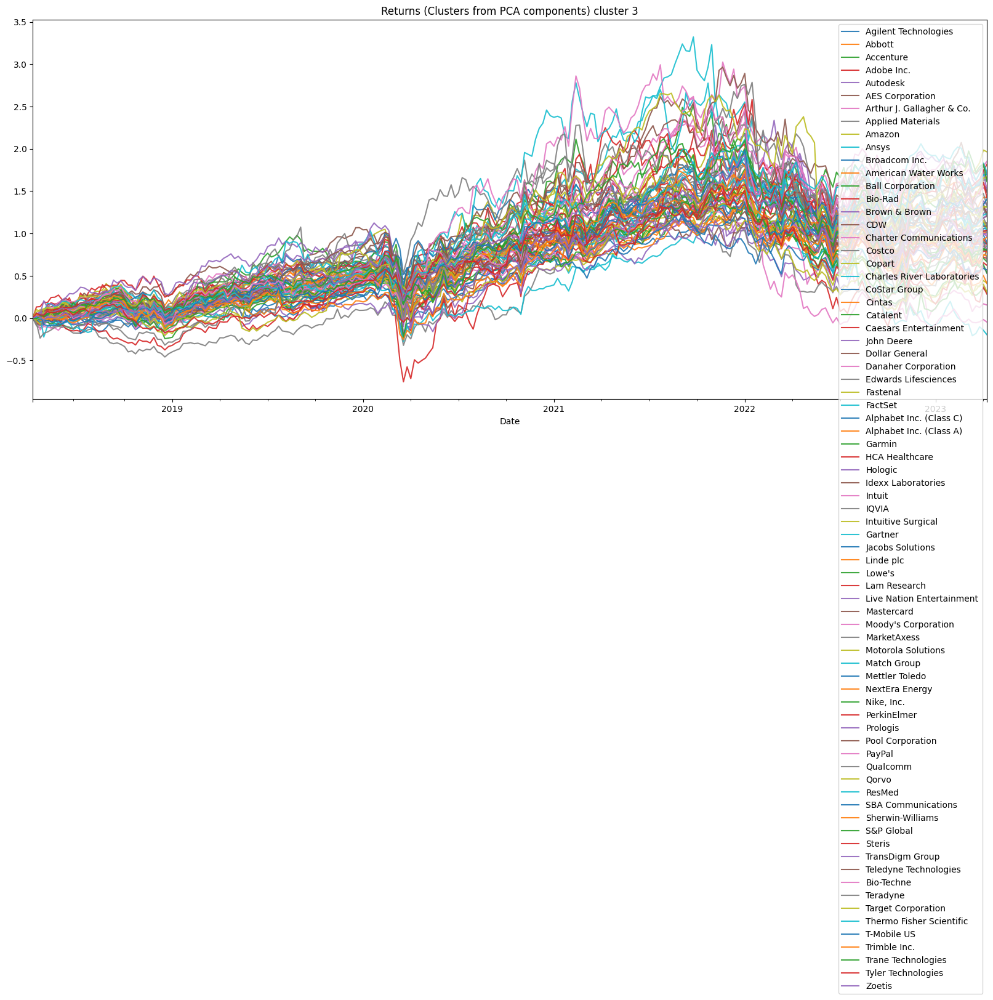

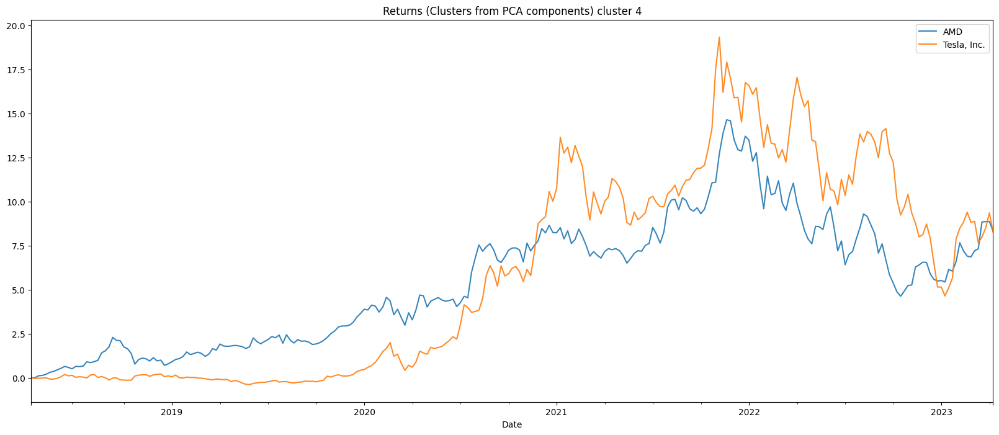

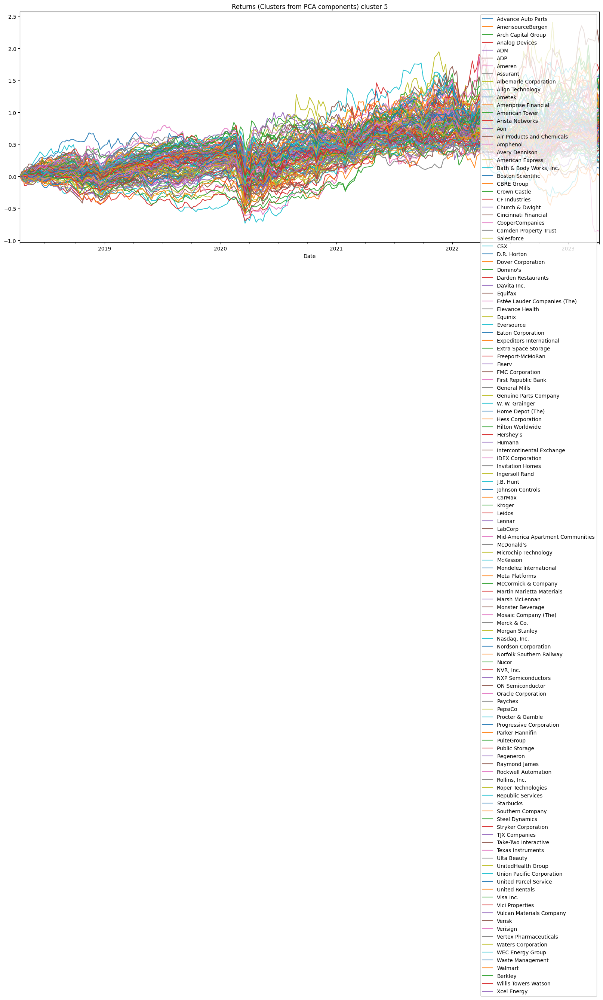

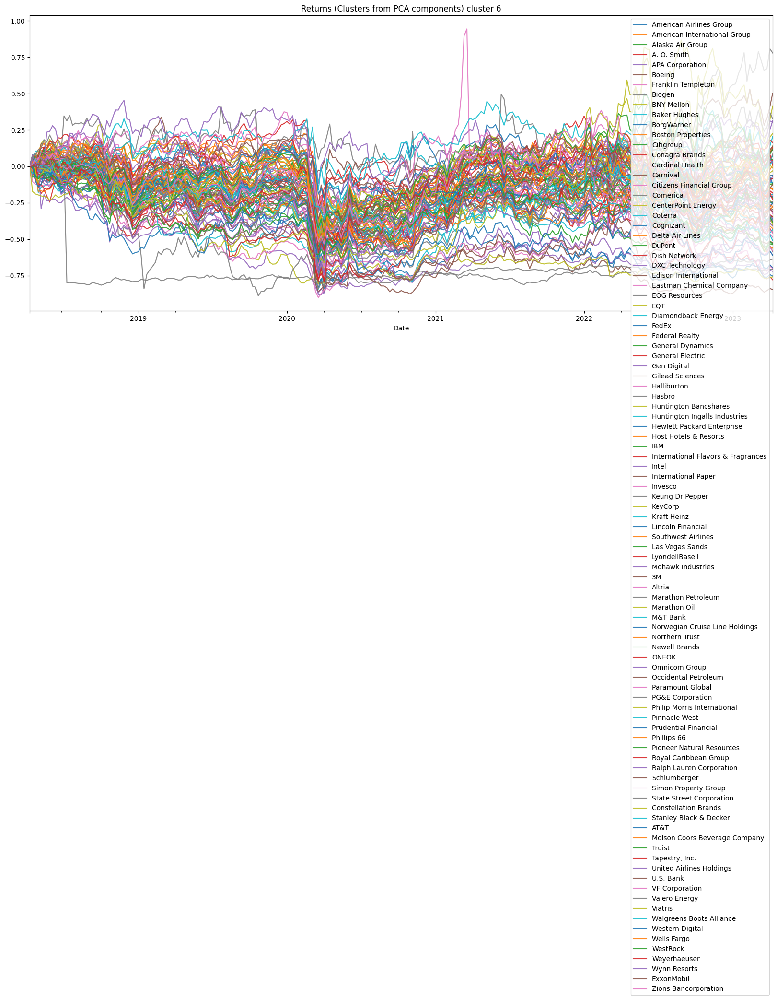

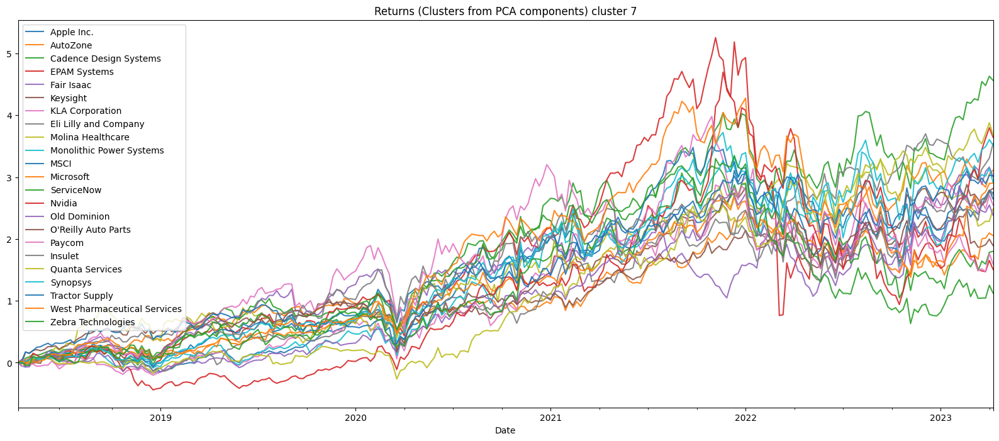

In [236]:
for c in sorted(clusters):
    plt.figure(figsize = (20,8))
    for symbol in clusters[c]:
        plot_stock(symbol, stocks=returns)
    plt.title("Returns (Clusters from PCA components) cluster " + str(c))
    plt.legend()
    plt.show()